In [ ]:
#Reading in files----RG
import matplotlib.pyplot as plt
import numpy as np
import pandas as pd
import seaborn as sns
from sklearn.preprocessing import LabelEncoder
from sklearn.linear_model import LinearRegression
from sklearn.model_selection import train_test_split
from sklearn.linear_model import LinearRegression, Lasso, Ridge
from sklearn.pipeline import Pipeline
from sklearn.preprocessing import RobustScaler
from sklearn import metrics
from sklearn import preprocessing
from sklearn.metrics import mean_squared_error,mean_absolute_error
from sklearn.metrics import mean_squared_error, r2_score
from sklearn.preprocessing import SplineTransformer
from sklearn.pipeline import make_pipeline
from sklearn import metrics
from sklearn.naive_bayes import GaussianNB
from sklearn.metrics import confusion_matrix
from sklearn.metrics import classification_report
import graphviz
from sklearn.tree import DecisionTreeClassifier, export_graphviz
from sklearn.ensemble import RandomForestClassifier
from sklearn.metrics import confusion_matrix,classification_report,accuracy_score, ConfusionMatrixDisplay
from sklearn.ensemble import AdaBoostClassifier
from sklearn.metrics import accuracy_score

vgsales = pd.read_csv('vgsales.csv')
#dropping unknown values-----RG
vgsales = vgsales.replace('Halo 3',np.NaN)
vgsales = vgsales.dropna()


#Years covered: 

In [ ]:
# I split up the first box into reading in, dropping values, and next the maxes 
#it kept causing an error ---co

In [ ]:
#Question List/Objectives List-----just type completed afterwards and initials
#What years were covered?
#list of consoles
#Which game is the highest grossing global sales
#Switch strings to integers to include them in correlation heat map : genre, publisher, platform

In [ ]:
# General overview----co
vgsales.head()

,Rank,Name,Platform,Year,Genre,Publisher,NA_Sales,EU_Sales,JP_Sales,Other_Sales,Global_Sales
0,1,Wii Sports,Wii,2006.0,Sports,Nintendo,41.49,29.02,3.77,8.46,82.74
1,2,Super Mario Bros.,NES,1985.0,Platform,Nintendo,29.08,3.58,6.81,0.77,40.24
2,3,Mario Kart Wii,Wii,2008.0,Racing,Nintendo,15.85,12.88,3.79,3.31,35.82
3,4,Wii Sports Resort,Wii,2009.0,Sports,Nintendo,15.75,11.01,3.28,2.96,33.00
4,5,Pokemon Red/Pokemon Blue,GB,1996.0,Role-Playing,Nintendo,11.27,8.89,10.22,1.00,31.37


In [ ]:
# 5 number summary -co
vgsales.describe()

,Rank,Year,NA_Sales,EU_Sales,JP_Sales,Other_Sales,Global_Sales
count,16290.00000,16290.000000,16290.000000,16290.000000,16290.000000,16290.000000,16290.000000
mean,8290.69644,2006.405525,0.265174,0.147567,0.078830,0.048355,0.540198
std,4792.36601,5.832589,0.820239,0.508885,0.311889,0.189871,1.564755
min,1.00000,1980.000000,0.000000,0.000000,0.000000,0.000000,0.010000
25%,4133.25000,2003.000000,0.000000,0.000000,0.000000,0.000000,0.060000
50%,8292.50000,2007.000000,0.080000,0.020000,0.000000,0.010000,0.170000
75%,12439.75000,2010.000000,0.240000,0.110000,0.040000,0.040000,0.480000
max,16600.00000,2020.000000,41.490000,29.020000,10.220000,10.570000,82.740000


In [ ]:
#correlation ---co
correlation=vgsales.corr()
round(correlation,4)


<ipython-input-6-339872c07d41>:2: FutureWarning: The default value of numeric_only in DataFrame.corr is deprecated. In a future version, it will default to False. Select only valid columns or specify the value of numeric_only to silence this warning.
  correlation=vgsales.corr()


,Rank,Year,NA_Sales,EU_Sales,JP_Sales,Other_Sales,Global_Sales
Rank,1.0000,0.1781,-0.4004,-0.3789,-0.2693,-0.3325,-0.4270
Year,0.1781,1.0000,-0.0916,0.0061,-0.1694,0.0411,-0.0748
NA_Sales,-0.4004,-0.0916,1.0000,0.7686,0.4524,0.6334,0.9411
EU_Sales,-0.3789,0.0061,0.7686,1.0000,0.4367,0.7257,0.9032
JP_Sales,-0.2693,-0.1694,0.4524,0.4367,1.0000,0.2908,0.6137
Other_Sales,-0.3325,0.0411,0.6334,0.7257,0.2908,1.0000,0.7473
Global_Sales,-0.4270,-0.0748,0.9411,0.9032,0.6137,0.7473,1.0000


<Axes: >

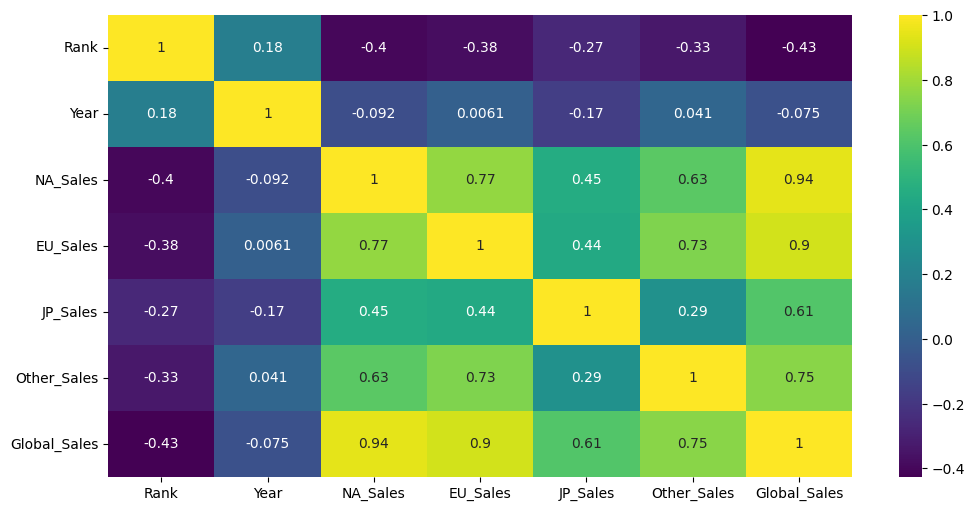

In [ ]:
#correlation heatmap----co
plt.figure(figsize=(12,6))
sns.heatmap((correlation), cmap='viridis',  annot=True)

In [ ]:
#originally written (This was the first thing)
import matplotlib.pyplot as plt
import numpy as np
import pandas as pd
import seaborn as sns

vgsales = pd.read_csv('vgsales.csv')

vgsales = vgsales.dropna()
vgsales

print('The best selling videogame of all time, regardless of other variables, is', vgsales.iloc[vgsales['Global_Sales'].argmax()]['Name'])
print('The best year for videogame sales, regardless of other variables, is', vgsales.iloc[vgsales['Global_Sales'].argmax()]['Year'])
print('The best selling videogame genre of all time, regardless of other variables, is', vgsales.iloc[vgsales['Global_Sales'].argmax()]['Genre'])

The best selling videogame of all time, regardless of other variables, is Wii Sports
The best year for videogame sales, regardless of other variables, is 2006.0
The best selling videogame genre of all time, regardless of other variables, is Sports


Text(0.5, 1.0, 'Number of Videogames per Year')

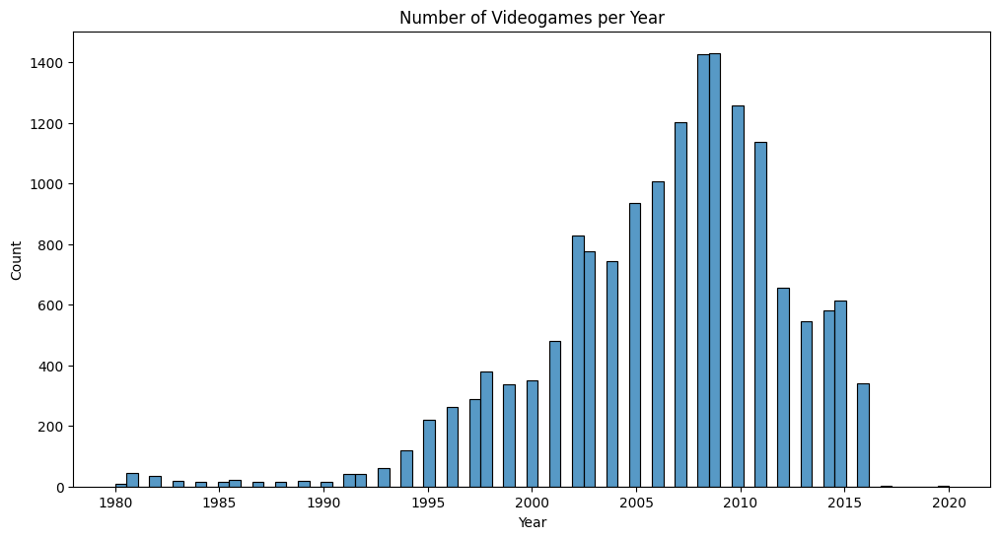

In [ ]:
plt.figure(figsize=(12,6))
sns.histplot(data=vgsales, x='Year')
plt.title("Number of Videogames per Year")

([0, 1, 2, 3, 4, 5, 6, 7, 8, 9, 10, 11],
 [Text(0, 0, 'Sports'),
  Text(1, 0, 'Platform'),
  Text(2, 0, 'Racing'),
  Text(3, 0, 'Role-Playing'),
  Text(4, 0, 'Puzzle'),
  Text(5, 0, 'Misc'),
  Text(6, 0, 'Shooter'),
  Text(7, 0, 'Simulation'),
  Text(8, 0, 'Action'),
  Text(9, 0, 'Fighting'),
  Text(10, 0, 'Adventure'),
  Text(11, 0, 'Strategy')])

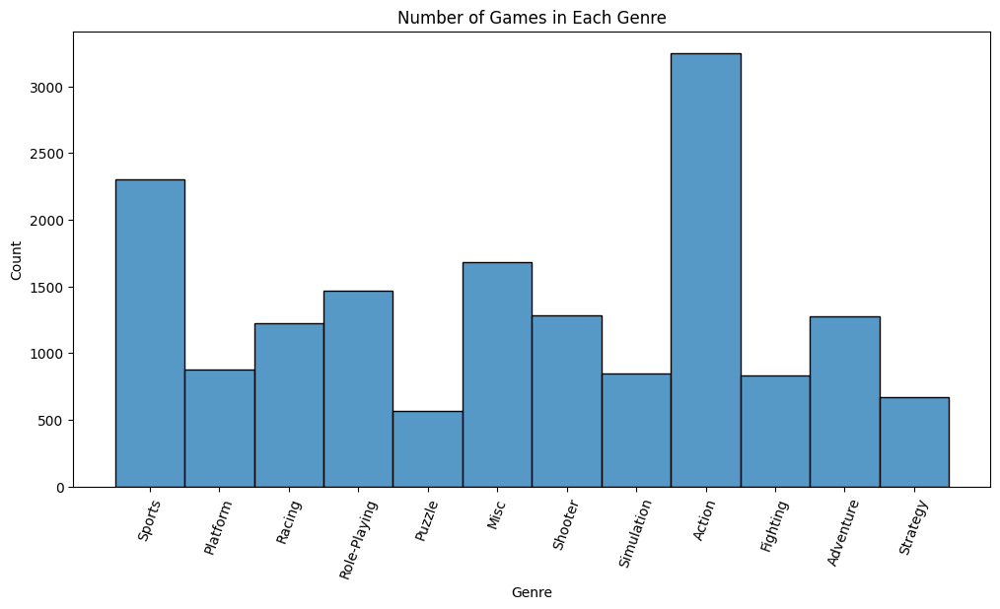

In [ ]:
plt.figure(figsize=(12,6))
sns.histplot(data=vgsales, x='Genre')
plt.title("Number of Games in Each Genre")
plt.xticks(rotation = 70)

([0,
  1,
  2,
  3,
  4,
  5,
  6,
  7,
  8,
  9,
  10,
  11,
  12,
  13,
  14,
  15,
  16,
  17,
  18,
  19,
  20,
  21,
  22,
  23,
  24,
  25,
  26,
  27,
  28,
  29,
  30],
 [Text(0, 0, 'Wii'),
  Text(1, 0, 'NES'),
  Text(2, 0, 'GB'),
  Text(3, 0, 'DS'),
  Text(4, 0, 'X360'),
  Text(5, 0, 'PS3'),
  Text(6, 0, 'PS2'),
  Text(7, 0, 'SNES'),
  Text(8, 0, 'GBA'),
  Text(9, 0, '3DS'),
  Text(10, 0, 'PS4'),
  Text(11, 0, 'N64'),
  Text(12, 0, 'PS'),
  Text(13, 0, 'XB'),
  Text(14, 0, 'PC'),
  Text(15, 0, '2600'),
  Text(16, 0, 'PSP'),
  Text(17, 0, 'XOne'),
  Text(18, 0, 'GC'),
  Text(19, 0, 'WiiU'),
  Text(20, 0, 'GEN'),
  Text(21, 0, 'DC'),
  Text(22, 0, 'PSV'),
  Text(23, 0, 'SAT'),
  Text(24, 0, 'SCD'),
  Text(25, 0, 'WS'),
  Text(26, 0, 'NG'),
  Text(27, 0, 'TG16'),
  Text(28, 0, '3DO'),
  Text(29, 0, 'GG'),
  Text(30, 0, 'PCFX')])

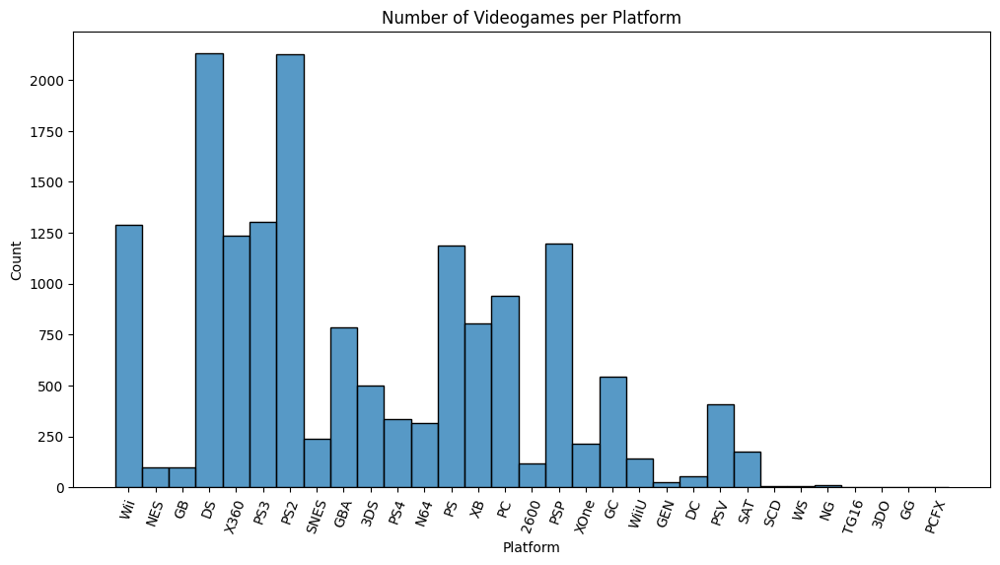

In [ ]:
plt.figure(figsize=(12,6))
sns.histplot(data=vgsales, x='Platform')
plt.title("Number of Videogames per Platform")
plt.xticks(rotation = 70)

In [ ]:
vgsales["Genre"].value_counts()
vgsales["Publisher"].value_counts()
valCount = vgsales["Platform"].value_counts()


In [ ]:
vgsales.shape #shape of vgsales originally

(16291, 11)

In [ ]:
vgsales.head()

,Rank,Name,Platform,Year,Genre,Publisher,NA_Sales,EU_Sales,JP_Sales,Other_Sales,Global_Sales
0,1,Wii Sports,Wii,2006.0,Sports,Nintendo,41.49,29.02,3.77,8.46,82.74
1,2,Super Mario Bros.,NES,1985.0,Platform,Nintendo,29.08,3.58,6.81,0.77,40.24
2,3,Mario Kart Wii,Wii,2008.0,Racing,Nintendo,15.85,12.88,3.79,3.31,35.82
3,4,Wii Sports Resort,Wii,2009.0,Sports,Nintendo,15.75,11.01,3.28,2.96,33.00
4,5,Pokemon Red/Pokemon Blue,GB,1996.0,Role-Playing,Nintendo,11.27,8.89,10.22,1.00,31.37


In [ ]:
#Seeing if Global sales is just the sum of other sales
vgsales['Total Sales']= vgsales['NA_Sales']+ vgsales['EU_Sales']+ vgsales['JP_Sales']+ vgsales['Other_Sales']

vgsales.head() #Global sales is just the sum of the other sales, so going to not use them for correlation

,Rank,Name,Platform,Year,Genre,Publisher,NA_Sales,EU_Sales,JP_Sales,Other_Sales,Global_Sales,Total Sales
0,1,Wii Sports,Wii,2006.0,Sports,Nintendo,41.49,29.02,3.77,8.46,82.74,82.74
1,2,Super Mario Bros.,NES,1985.0,Platform,Nintendo,29.08,3.58,6.81,0.77,40.24,40.24
2,3,Mario Kart Wii,Wii,2008.0,Racing,Nintendo,15.85,12.88,3.79,3.31,35.82,35.83
3,4,Wii Sports Resort,Wii,2009.0,Sports,Nintendo,15.75,11.01,3.28,2.96,33.00,33.00
4,5,Pokemon Red/Pokemon Blue,GB,1996.0,Role-Playing,Nintendo,11.27,8.89,10.22,1.00,31.37,31.38


In [ ]:
#Dropping original columns dropped as they equal Global sales
#Drop  Column
vgsales.drop(columns='NA_Sales', inplace=True, axis=1)
vgsales.drop(columns='EU_Sales', inplace=True, axis=1)
vgsales.drop(columns='JP_Sales', inplace=True, axis=1)
vgsales.drop(columns='Other_Sales', inplace=True, axis=1)
vgsales.drop(columns='Total Sales', inplace=True, axis=1)

In [ ]:
vgsales.head() #checking to make sure columns dropped

,Rank,Name,Platform,Year,Genre,Publisher,Global_Sales
0,1,Wii Sports,Wii,2006.0,Sports,Nintendo,82.74
1,2,Super Mario Bros.,NES,1985.0,Platform,Nintendo,40.24
2,3,Mario Kart Wii,Wii,2008.0,Racing,Nintendo,35.82
3,4,Wii Sports Resort,Wii,2009.0,Sports,Nintendo,33.00
4,5,Pokemon Red/Pokemon Blue,GB,1996.0,Role-Playing,Nintendo,31.37


In [ ]:
#creating labelEncoder--co
le = LabelEncoder()

In [ ]:
#Settign up transform for Genre, platform, piblisher (hot coding)

vgsales['Genre'] = le.fit_transform(vgsales['Genre'])   #Genre


In [ ]:
dummy_genre =pd.get_dummies(vgsales,drop_first=True) #incorporating dummies model and dropping the first column 

In [ ]:
vgsales.shape #shape with dummies model

(16291, 7)

In [ ]:
vgsales['Publisher'] = le.fit_transform(vgsales['Publisher'])  #Publisher transformation into hot coding


In [ ]:
dummy_pub= pd.get_dummies(vgsales,drop_first=True) #incorporating Publisher dummies into the model and dropping the first column 

In [ ]:
vgsales['Platform'] = le.fit_transform(vgsales['Platform'])    #Platform into hot code

In [ ]:
dummy_plat= pd.get_dummies(vgsales,drop_first=True) #incorporating Platform dummies into the dataset and dropping first column

In [ ]:
#definig median for Global_sales
med=np.median(vgsales['Global_Sales'])
print(med)

0.17


In [ ]:
#Definig Parameter for High and Low of Global Sales  (thank you Prof. Beagley)

def above_median(sales):
  if sales > med:
    return 'High'
  else:
    return "Low"

In [ ]:
#Creating the Column for high/low Global_Sales
vgsales['High/Low']= vgsales.apply (lambda row: above_median(row['Global_Sales']), axis=1) 

In [ ]:
vgsales.head()

,Rank,Name,Platform,Year,Genre,Publisher,Global_Sales,High/Low
0,1,Wii Sports,26,2006.0,10,359,82.74,High
1,2,Super Mario Bros.,11,1985.0,4,359,40.24,High
2,3,Mario Kart Wii,26,2008.0,6,359,35.82,High
3,4,Wii Sports Resort,26,2009.0,10,359,33.00,High
4,5,Pokemon Red/Pokemon Blue,5,1996.0,7,359,31.37,High


In [ ]:
#Designating feature matrix and target matrices

X = vgsales.drop(['Global_Sales', 'Name','Rank','High/Low'], axis=1) #feature matrix
#X = pd.get_dummies(X,drop_first=True) do we need this one
y = vgsales['High/Low'] #target matrix

In [ ]:
#Input variables (feature matrix)

X.head()

,Platform,Year,Genre,Publisher
0,26,2006.0,10,359
1,11,1985.0,4,359
2,26,2008.0,6,359
3,26,2009.0,10,359
4,5,1996.0,7,359


In [ ]:
vgsales.head()

,Rank,Name,Platform,Year,Genre,Publisher,Global_Sales,High/Low
0,1,Wii Sports,26,2006.0,10,359,82.74,High
1,2,Super Mario Bros.,11,1985.0,4,359,40.24,High
2,3,Mario Kart Wii,26,2008.0,6,359,35.82,High
3,4,Wii Sports Resort,26,2009.0,10,359,33.00,High
4,5,Pokemon Red/Pokemon Blue,5,1996.0,7,359,31.37,High


In [ ]:
#Number of global sales labeled High
HighCount=vgsales[vgsales['High/Low']=='High'].shape
print(HighCount)

(8062, 8)


In [ ]:
#Number of global sales labeled Low
LowCount=vgsales[vgsales['High/Low']=='Low'].shape
print(LowCount)

(8229, 8)


In [ ]:
#splitting the vgsales dataset
X_train, X_test, y_train, y_test = train_test_split(X, y, test_size=0.33, random_state=327)

In [ ]:
#GaussianNB model
Bayes = GaussianNB()

#fitting Bayes
Bayes.fit(X_train,y_train)

#prediction Bayes
predBAYES = Bayes.predict(X_test)
print(predBAYES)

['Low' 'Low' 'Low' ... 'Low' 'Low' 'Low']


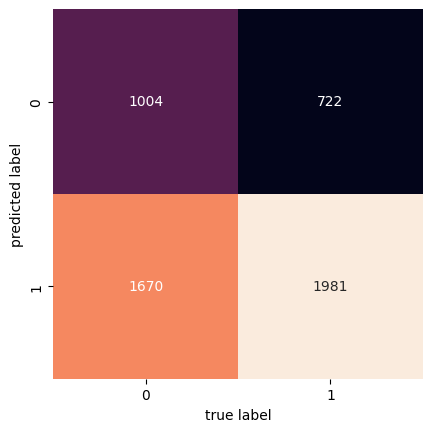

In [ ]:
#Confusion Matrix for Bayes

matBAYES = confusion_matrix(y_test, predBAYES)
sns.heatmap(matBAYES.T, square=True, annot=True, fmt='d', cbar=False)
plt.xlabel('true label')
plt.ylabel('predicted label');

In [ ]:
#Scores for Bayes Model
scoreBAYES= classification_report(y_test, predBAYES)

print(scoreBAYES)

              precision    recall  f1-score   support

        High       0.58      0.38      0.46      2674
         Low       0.54      0.73      0.62      2703

    accuracy                           0.56      5377
   macro avg       0.56      0.55      0.54      5377
weighted avg       0.56      0.56      0.54      5377



In [ ]:
#Decision Tree

tree = DecisionTreeClassifier()
tree.fit(X_train,y_train)

DecisionTreeClassifier()

In [ ]:
#Predictions for Decision Tree

predTREE = tree.predict(X_test)
print(predTREE)

['Low' 'High' 'Low' ... 'Low' 'High' 'High']


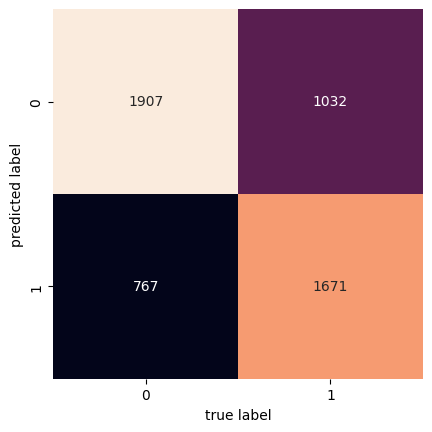

In [ ]:
#Confustion Matrix for Decision Tree

matTREE = confusion_matrix(y_test, predTREE)
sns.heatmap(matTREE.T, square=True, annot=True, fmt='d', cbar=False)
plt.xlabel('true label')
plt.ylabel('predicted label');

In [ ]:
#Scores for Decision Tree Confusion Matrix
scoreTREE= classification_report(y_test, predTREE)

print(scoreTREE)

              precision    recall  f1-score   support

        High       0.65      0.71      0.68      2674
         Low       0.69      0.62      0.65      2703

    accuracy                           0.67      5377
   macro avg       0.67      0.67      0.66      5377
weighted avg       0.67      0.67      0.66      5377



In [ ]:
#Visual of Decision Tree
dot_data = export_graphviz(tree, out_file=None, 
                           feature_names=X.columns,  
                           #class_names= vgsales['High/Low'].unique(),  
                           filled=True, rounded=True,  
                           special_characters=True)  
graph = graphviz.Source(dot_data)
graph

In [ ]:
#Random Forest Classifier

# Use 10 random trees
modelRANDOM = RandomForestClassifier(n_estimators=10,random_state=101)

#fitting Random Forest Classifier Model
modelRANDOM.fit(X_train,y_train)

RandomForestClassifier(n_estimators=10, random_state=101)

In [ ]:
#Predictions for Random Forest Classifier

predRANDOM = modelRANDOM.predict(X_test)

In [ ]:
predRANDOM # printing predRANDOM

array(['Low', 'High', 'Low', ..., 'Low', 'Low', 'High'], dtype=object)

In [ ]:
#Scores for Random Tree Confusion Matrix
scoreRANDOM= classification_report(y_test, predRANDOM)

print(scoreRANDOM)

              precision    recall  f1-score   support

        High       0.67      0.70      0.69      2674
         Low       0.69      0.67      0.68      2703

    accuracy                           0.68      5377
   macro avg       0.68      0.68      0.68      5377
weighted avg       0.68      0.68      0.68      5377



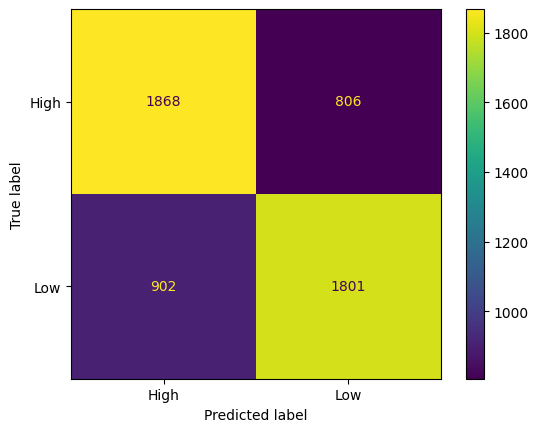

In [ ]:
#Confusion Matrix for Random Tree Classifier
cmRANDOM = confusion_matrix(y_test, predRANDOM, labels=modelRANDOM.classes_)
disp = ConfusionMatrixDisplay(confusion_matrix=cmRANDOM,display_labels=modelRANDOM.classes_)
disp.plot()
plt.show()

In [ ]:
modelRANDOM.feature_importances_ #Grabbing the "importance" of each of the inputs (How much of the pie did each input get) (Publisher currently has the highest importance)

array([0.13346546, 0.2732517 , 0.20463683, 0.38864601])

In [ ]:
#Test error for Random Forest Classifier
test_error = []

for n in range(1,40):
    # Use n random trees
    model_TESTR = RandomForestClassifier(n_estimators=n)
    model_TESTR.fit(X_train,y_train)                          #fitting the model
    test_preds = model_TESTR.predict(X_test)
    test_error.append(1-accuracy_score(test_preds,y_test))

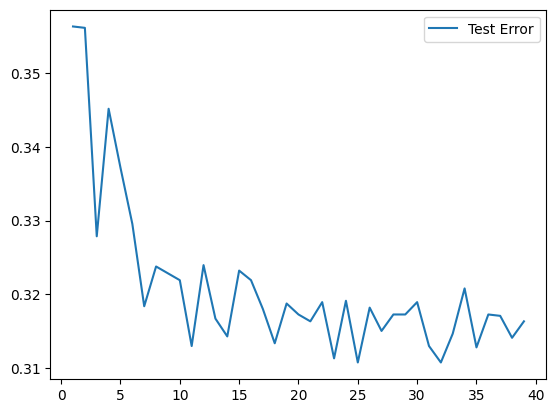

In [ ]:
plt.plot(range(1,40),test_error,label='Test Error')
plt.legend()

In [ ]:
#AdaBoost

modelADA = AdaBoostClassifier(n_estimators=1)

#fitting ADA
modelADA.fit(X_train,y_train)

#Predictiong for ADA
predADA = modelADA.predict(X_test)

In [ ]:
predADA

array(['Low', 'Low', 'Low', ..., 'Low', 'Low', 'Low'], dtype=object)

In [ ]:
#scores for ADA
scoreADA=classification_report(y_test,predADA)
print(scoreADA)

              precision    recall  f1-score   support

        High       0.63      0.22      0.33      2674
         Low       0.53      0.87      0.66      2703

    accuracy                           0.55      5377
   macro avg       0.58      0.55      0.49      5377
weighted avg       0.58      0.55      0.50      5377



In [ ]:
#grabbing Importances from ADA
modelADA.feature_importances_ #in this case year is the most important

array([0., 1., 0., 0.])

In [ ]:
modelADA.feature_importances_.argmax() #pulling out how many are important

1

In [ ]:
X.columns[1] #dictionary lock on important feature

'Year'

In [ ]:
len(X.columns)

4

In [ ]:
#Scores ada boost with importance features (AFTER)
error_rates = []

for n in range(1,4): #second number is from len
    
    model_testADA = AdaBoostClassifier(n_estimators=n)
    model_testADA.fit(X_train,y_train)
    predsTESTADA = model_testADA.predict(X_test)
    err = 1 - accuracy_score(y_test,predsTESTADA)
    
    error_rates.append(err)

In [ ]:
#Score for Importance ada boosted with importances
scoretestADA= classification_report(y_test,predsTESTADA)
print(scoretestADA)

              precision    recall  f1-score   support

        High       0.55      0.78      0.65      2674
         Low       0.63      0.37      0.46      2703

    accuracy                           0.57      5377
   macro avg       0.59      0.57      0.55      5377
weighted avg       0.59      0.57      0.55      5377



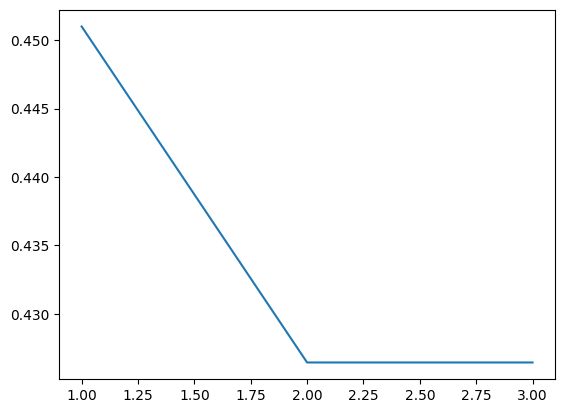

In [ ]:
plt.plot(range(1,4),error_rates)

In [ ]:
  model_testADA.feature_importances_

array([0.33333333, 0.66666667, 0.        , 0.        ])

In [ ]:
feats = pd.DataFrame(index=X.columns,data= model_testADA.feature_importances_,columns=['Importance'])

In [ ]:
imp_feats = feats[feats['Importance']>0]
imp_feats = imp_feats.sort_values("Importance")

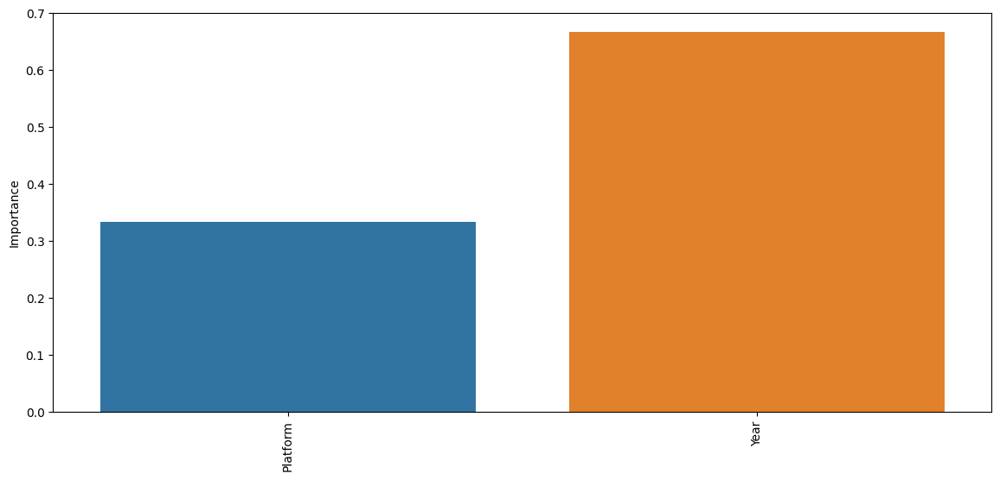

In [ ]:
plt.figure(figsize=(14,6))
sns.barplot(data=imp_feats.sort_values('Importance'),x=imp_feats.sort_values('Importance').index,y='Importance')

plt.xticks(rotation=90);